In [1]:
import math
import os, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import datetime as dt
import random

cwd = os.getcwd()
project_path = cwd[:cwd.find('pygents')+7]
if project_path not in sys.path: sys.path.append(project_path)
os.chdir(project_path)

if 'aigents_api' in sys.modules:
    del sys.modules['aigents_api']
if 'learn' in sys.modules:
    del sys.modules['learn']
if 'util' in sys.modules:
    del sys.modules['util']

from pygents.learn import count_ngrams_plus, count_ngrams_plus_tf_idf
from pygents.aigents_api import TextMetrics
from pygents.plot import plot_dict
from pygents.util import dictcount

model_family = 'multiclass_view_cleaned'
if not os.path.exists('data/models/distortions/multiclass_task/split_kaggle_multiclass/'+model_family+'/'):
    os.makedirs('data/models/distortions/multiclass_task/split_kaggle_multiclass/'+model_family+'/')
for split_name in ['first_split','second_split','third_split']:
    split_path = 'data/models/distortions/multiclass_task/split_kaggle_multiclass/'+model_family+'/'+split_name+'/'
    if not os.path.exists(split_path):
        os.makedirs(split_path)

grand_t0 = dt.datetime.now()

def language_metrics(metrics_list, name_split_folder):
    metrics = {}
    for m in metrics_list:
        metrics[m] = f'data/models/distortions/multiclass_task/split_kaggle_multiclass/{model_family}/{name_split_folder}/{m}.txt'
    return metrics

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kzvau\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# Dataset: Multiple Distorions (sagarikashreevastava)
# Paper: https://aclanthology.org/2021.clpsych-1.17/
# Data: https://www.kaggle.com/datasets/sagarikashreevastava/cognitive-distortion-detetction-dataset

# !pip install kagglehub
import kagglehub
multiclass_dataset_path = kagglehub.dataset_download("sagarikashreevastava/cognitive-distortion-detetction-dataset")
multiclass_dataset_file_path = multiclass_dataset_path + "/Annotated_data.csv"

df = pd.read_csv(multiclass_dataset_file_path) 
df = df.drop('Id_Number', axis=1) # delete columnb with id 

#df = df3[0:5] # hack for test!

df

,Patient Question,Distorted part,Dominant Distortion,Secondary Distortion (Optional)
0,"Hello, I have a beautiful,smart,outgoing and a...",The voice are always fimilar (someone she know...,Personalization,NaN
1,Since I was about 16 years old I’ve had these ...,I feel trapped inside my disgusting self and l...,Labeling,Emotional Reasoning
2,So I’ve been dating on and off this guy for a...,NaN,No Distortion,NaN
3,My parents got divorced in 2004. My mother has...,NaN,No Distortion,NaN
4,I don’t really know how to explain the situati...,I refused to go because I didn’t know if it wa...,Fortune-telling,Emotional Reasoning
...,...,...,...,...
2525,I’m a 21 year old female. I spent most of my l...,NaN,No Distortion,NaN
2526,I am 21 female and have not had any friends fo...,Now I am at university my peers around me all ...,Overgeneralization,NaN
2527,From the U.S.: My brother is 19 years old and ...,He claims he’s severely depressed and has outb...,Mental filter,Mind Reading
2528,From the U.S.: I am a 21 year old woman who ha...,NaN,No Distortion,NaN


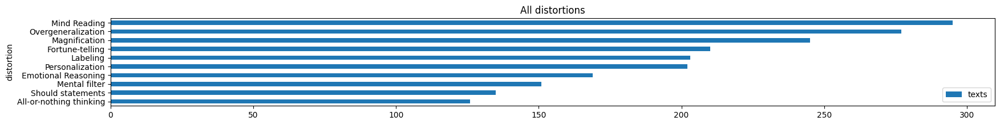

In [3]:
dists = {}
for _, row in df.iterrows():
        # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
        text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
        primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
        secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else 'No Distortion'  # The secondary distortion from the 4th column, if it exists
        ground_distortions = []
        if primary_distortion != 'No Distortion':
            ground_distortions.append(primary_distortion)
        if secondary_distortion != 'No Distortion':
            ground_distortions.append(secondary_distortion)
        for d in ground_distortions:
            dictcount(dists,d)
        
plot_dict(
    dists,
    labels="distortion",
    values="texts",
    title="All distortions",
    head=20
)

# Create learning functions
### Functions for including key N-grams and creating model files

In [4]:
def ngrams_inclusion(model_ngram, ngram_inclusion_threshold):
    filtered_model_ngram = {}
    for distortion, ngram_dict in model_ngram.items():
        # Find the maximum metric value for the current distortion
        max_value = max(ngram_dict.values()) if ngram_dict else 0
        threshold_value = max_value * (ngram_inclusion_threshold / 100)

        # Filter n-grams that meet or exceed the threshold value
        filtered_model_ngram[distortion] = {
            ngram: metric for ngram, metric in ngram_dict.items() if metric >= threshold_value
        }
    return filtered_model_ngram

def create_model_files(filtered_model_ngram, name_split_folder):
    # Create .txt files for each distortion
    output_dir = f'data/models/distortions/multiclass_task/split_kaggle_multiclass/{model_family}/{name_split_folder}'
    distortion_file_path = f"{output_dir}/Distortion.txt"
    distortions_labels = []

    with open(distortion_file_path, "w", encoding="utf-8") as distortion_file:
        for distortion, ngrams in filtered_model_ngram.items():
            distortion_ = distortion.replace(" ", "_")
            file_path = f"{output_dir}/{distortion_}.txt"
            sorted_ngrams = sorted(ngrams.items(), key=lambda x: x[1], reverse=True) 
            distortions_labels.append(distortion_)
            with open(file_path, "w", encoding="utf-8") as f:
                for ngram, metric_value in sorted_ngrams:
                    ngram_str = ' '.join(ngram) 
                    f.write(f"{ngram_str}\t{metric_value}\n")
                    if distortion != "No Distortion":
                            distortion_file.write(f"{ngram_str}\t{metric_value}\n")
    
    return (list(set(distortions_labels) - {'No_Distortion'}))

### Evaluate functions

In [5]:
all_metrics = ['All-or-nothing_thinking','Fortune-telling','Mental_filter','Overgeneralization','Labeling',
          'Mind_Reading','Personalization','Emotional_Reasoning','Magnification','Should_statements']

def our_evaluator_test(expected_distortions,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = True if (m in expected_distortions) else False
    return dic

def our_evaluator_tm(tm,text,threshold):
    metrics = tm.get_sentiment_words(text)
    dic = {}
    for m in all_metrics:
        dic[m] = True if m in metrics and metrics[m] > threshold else False
    return dic

def our_evaluator_true(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = True
    return dic
    
def our_evaluator_false(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = False
    return dic

def our_evaluator_random(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = random.choice([True, False])
    return dic

def dictval(dic,key,val):
    return dic[key] if key in dic else val 

def pre_rec_f1_from_counts(true_positive, true_negative, false_positive, false_negative):
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    return precision, recall, 2 * precision * recall / (precision + recall) if precision > 0 or recall > 0 else 0 

def evaluate_tm_df(df,tm,evaluator,threshold,debug=False):
    true_positives = {}
    true_negatives = {}
    false_positives = {}
    false_negatives = {}
    pre = {}
    rec = {}
    f1 = {}
    acc = {}
    for _, row in df.iterrows():
        # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
        text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
        primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
        secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else 'No Distortion'  # The secondary distortion from the 4th column, if it exists
        ground_distortions = []
        if primary_distortion != 'No Distortion':
            ground_distortions.append(primary_distortion.replace(' ','_'))
        if secondary_distortion != 'No Distortion':
            ground_distortions.append(secondary_distortion.replace(' ','_'))

        if evaluator == our_evaluator_test:
            distortions_by_metric = evaluator(ground_distortions,text,threshold) #hack to test metrics
        else:
            distortions_by_metric = evaluator(tm,text,threshold)

        if debug:
            print(ground_distortions,'=>',[m for m in distortions_by_metric if distortions_by_metric[m]])
        
        for metric in distortions_by_metric:
            our_distortion = distortions_by_metric[metric]
            if (metric in ground_distortions) and our_distortion == True:
                dictcount(true_positives,metric)
            if (not metric in ground_distortions) and our_distortion == True:
                dictcount(false_positives,metric)
            if (not metric in ground_distortions) and our_distortion == False:
                dictcount(true_negatives,metric)
            if (metric in ground_distortions) and our_distortion == False:
                dictcount(false_negatives,metric)

    if debug:
        #print()
        print('TP:',true_positives)
        print('FP:',false_positives)
        print('TN:',true_negatives)
        print('FN:',false_negatives)
    
    for metric in all_metrics:
        precision, recall, f1score = pre_rec_f1_from_counts(dictval(true_positives,metric,0), dictval(true_negatives,metric,0), 
                                   dictval(false_positives,metric,0), dictval(false_negatives,metric,0))
        pre[metric] = precision
        rec[metric] = recall
        f1[metric] = f1score
        acc[metric] = (dictval(true_positives,metric,0) + dictval(true_negatives,metric,0)) / len(df)
    
    return pre, rec, f1, acc


### Function for analyzing the dataset

In [6]:
def analyse_dataset(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, df_train, df_test, name_split_folder, print_or_plot):
    
    if name_split_folder == 'first_split' and print_or_plot == 'print_results':
        print('\nN-gram selection metric:', ngram_selection_metric)
        print('N-gram max length:', ngram_max)
        print('N-gram inclusion threshold:', ngram_inclusion_threshold)

    if ngram_selection_metric == 'TF-IDF':
        model_ngram = count_ngrams_plus_tf_idf(df_train,ngram_max,binary=False,clean_punct=True)
    
    elif ngram_selection_metric in ['F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','FN*UFN*UF/D/D','CFR','FCR','MR','NLMI']:
        distortions, frequency, all_n_grams, frequency_self_normalized, unique_frequency, uniq_all_n_grams, n_gram_distortions, \
        norm_uniq_n_gram_dicts, n_gram_distortions_counts, norm, unique_frequency_self_normalized, norm_norm_uniq, norm_norm_uniq_norm, \
        norm_norm_uniq_norm_norm, fcr, cfr, mr, nl_mi, N = count_ngrams_plus(df_train,ngram_max,binary=False)
        
        selection_metrics = {
            'F':frequency,
            'UF':unique_frequency,
            'FN':frequency_self_normalized,
            'UFN':unique_frequency_self_normalized,
            'UFN/D/D':norm_uniq_n_gram_dicts,
            'FN*UFN':norm_norm_uniq,
            'FN*UFN/D':norm_norm_uniq_norm,
            'CFR':cfr,
            'FCR':fcr,
            'MR':mr,
            'NLMI':nl_mi}
        
        model_ngram = selection_metrics[ngram_selection_metric]

    # Filter out values below the threshold
    filtered_model_ngram = ngrams_inclusion(model_ngram, ngram_inclusion_threshold)

    # Create .txt files for each distortion
    distortions_labels = create_model_files(filtered_model_ngram, name_split_folder)
    tm = TextMetrics(language_metrics(distortions_labels, name_split_folder), encoding = "utf-8", debug=False)

    if print_or_plot == 'print_results':
        if name_split_folder == 'first_split':
            print('\tFIRST COMBINATION')
        elif name_split_folder == 'second_split':
            print('\n\tSECOND COMBINATION')
        elif name_split_folder == 'third_split':
            print('\n\tTHIRD COMBINATION')

    pres = [[] for i in range(len(all_metrics))]
    recs = [[] for i in range(len(all_metrics))]
    f1s = [[] for i in range(len(all_metrics))]
    accs = [[] for i in range(len(all_metrics))]
            
    for threshold in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
        pre, rec, f1, acc = evaluate_tm_df(df_test,tm,our_evaluator_tm,threshold)
        mi = 0
        if print_or_plot == 'print_results':
            #print('\t\tThreshold:', threshold, '(distortion, precision, recall, F1 score, accuracy):')
            print('\t\tThreshold:', threshold, '(distortion, F1 score):')
        for metric in all_metrics:
            pres[mi].append(pre[metric])
            recs[mi].append(rec[metric])
            f1s[mi].append(f1[metric])
            accs[mi].append(acc[metric])
            mi += 1
            if print_or_plot == 'print_results':
                #print('\t\t\t', metric, pre[metric], rec[metric], f1[metric], acc[metric], sep='\t')
                print('\t\t\t', metric, f1[metric], sep='\t')

    return {metric: f1s[i] for i, metric in enumerate(all_metrics)}

# Grid search
### Perform a grid search over all hyper-parameters to determine the best combination for building the model

In [7]:
def grid_search(df):
    part1 = df[df.index % 3 == 1]
    part2 = df[df.index % 3 == 2]
    part3 = df[df.index % 3 == 0]

    splits = [
        (pd.concat([part1, part2]), part3),  # (1 + 2) -> train, (3) -> test
        (pd.concat([part1, part3]), part2),  # (1 + 3) -> train, (2) -> test
        (pd.concat([part2, part3]), part1)   # (2 + 3) -> train, (1) -> test
    ]

    for ngram_selection_metric in ['TF-IDF','F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','CFR','FCR','MR','NLMI']:
        for ngram_max in range (1, 5):
            for ngram_inclusion_threshold in [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]:
                for i, (train_df, test_df) in enumerate(splits, start=1):
                    if i == 1:
                        first_split_f1s = analyse_dataset(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'first_split', 'print_results')
                    elif i == 2:
                        second_split_f1s = analyse_dataset(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'second_split', 'print_results')
                    elif i == 3:
                        third_split_f1s = analyse_dataset(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'third_split', 'print_results')

In [8]:
grid_search(df)


N-gram selection metric: TF-IDF
N-gram max length: 1
N-gram inclusion threshold: 90
	FIRST COMBINATION
		Threshold: 0.1 (distortion, F1 score):
				All-or-nothing_thinking	0.09511568123393317
				Fortune-telling	0.3597122302158273
				Mental_filter	0.09777777777777778
				Overgeneralization	0.17422434367541767
				Labeling	0.12605042016806722
				Mind_Reading	0.18505338078291816
				Personalization	0.2007722007722008
				Emotional_Reasoning	0.2650602409638555
				Magnification	0.15596330275229356
				Should_statements	0.11428571428571428
		Threshold: 0.2 (distortion, F1 score):
				All-or-nothing_thinking	0.09711286089238844
				Fortune-telling	0.4070796460176991
				Mental_filter	0.11627906976744187
				Overgeneralization	0.17647058823529413
				Labeling	0.14942528735632182
				Mind_Reading	0.19999999999999998
				Personalization	0.22330097087378642
				Emotional_Reasoning	0.326530612244898
				Magnification	0.17013888888888887
				Should_statements	0.15384615384615383
		Threshold: 0

### Our best model obtained through the optimal combination of hyper-parameters

In [8]:
# Best model
part1 = df[df.index % 3 == 1]
part2 = df[df.index % 3 == 2]
part3 = df[df.index % 3 == 0]

splits = [
    (pd.concat([part1, part2]), part3),  # (1 + 2) -> train, (3) -> test
    (pd.concat([part1, part3]), part2),  # (1 + 3) -> train, (2) -> test
    (pd.concat([part2, part3]), part1)   # (2 + 3) -> train, (1) -> test
]

for i, (train_df, test_df) in enumerate(splits, start=1):
    if i == 1:
        first_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'first_split', 'print_results')
    elif i == 2:
        second_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'second_split', 'print_results')
    elif i == 3:
        third_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'third_split', 'print_results')


N-gram selection metric: TF-IDF
N-gram max length: 2
N-gram inclusion threshold: 80
	FIRST COMBINATION
		Threshold: 0.1 (distortion, F1 score):
				All-or-nothing_thinking	0.10340775558166862
				Fortune-telling	0.3597122302158273
				Mental_filter	0.08235294117647059
				Overgeneralization	0.17422434367541767
				Labeling	0.12605042016806722
				Mind_Reading	0.25233644859813087
				Personalization	0.18295218295218296
				Emotional_Reasoning	0.20786516853932585
				Magnification	0.15272727272727274
				Should_statements	0.13414634146341464
		Threshold: 0.2 (distortion, F1 score):
				All-or-nothing_thinking	0.10352941176470588
				Fortune-telling	0.4070796460176991
				Mental_filter	0.087248322147651
				Overgeneralization	0.17560975609756097
				Labeling	0.14942528735632182
				Mind_Reading	0.29084380610412924
				Personalization	0.22841225626740946
				Emotional_Reasoning	0.2569444444444444
				Magnification	0.15480649188514356
				Should_statements	0.19730941704035873
		Threshold: 

# Plot heatmaps 
## Plot heatmaps illustrating the search for optimal hyperparameters

In [9]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

def matrix_plot(row_labels, col_labels, matrix, absmax, title = None, vmin = None, vmax = None, dpi = None, titlefontsize = None, width = 20):
    plt.rcParams["figure.figsize"] = (width,len(row_labels)/4)
    if not dpi is None:
        plt.rcParams["figure.dpi"] = dpi
    p = sns.heatmap(matrix, xticklabels=col_labels, yticklabels=row_labels, 
                    vmin = -absmax if vmin is None else vmin, 
                    vmax = absmax if vmax is None else vmax, 
                    cmap='RdYlGn', annot=True)
    if title is not None:
        if titlefontsize is None:
            titlefontsize = 32 if len(title) < 50 else round(32 * 50 / len(title))
        p.set_title(title,fontsize = titlefontsize)
    plt.show()

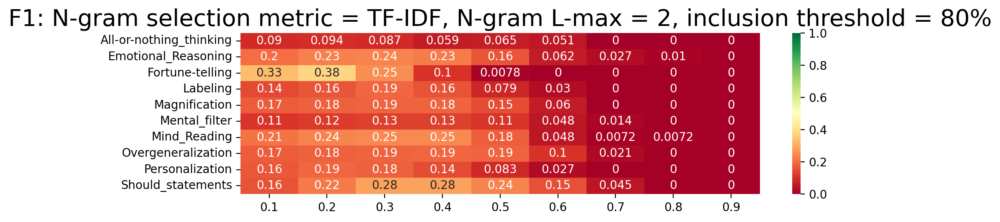

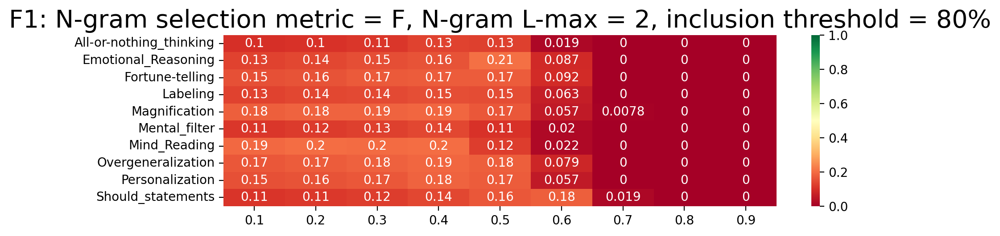

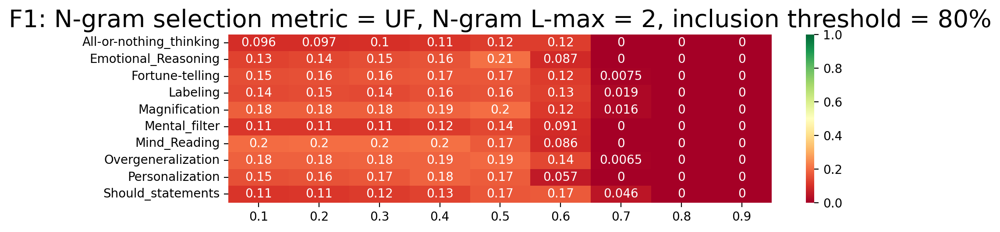

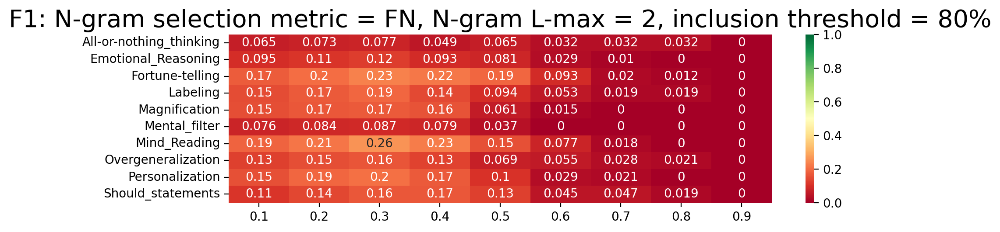

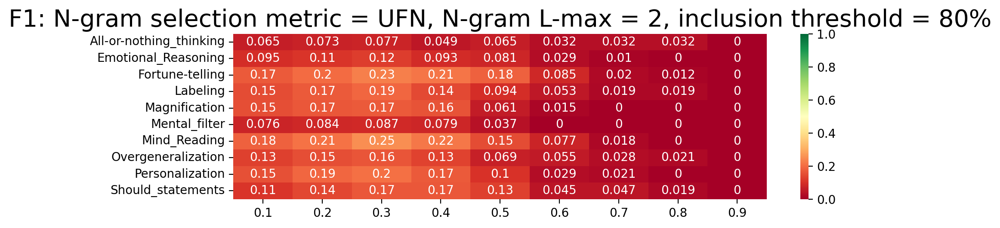

...

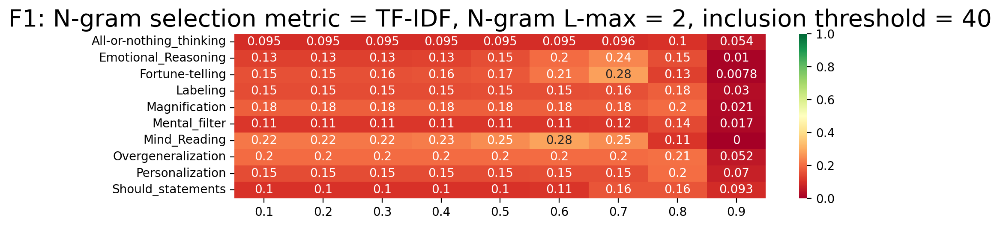

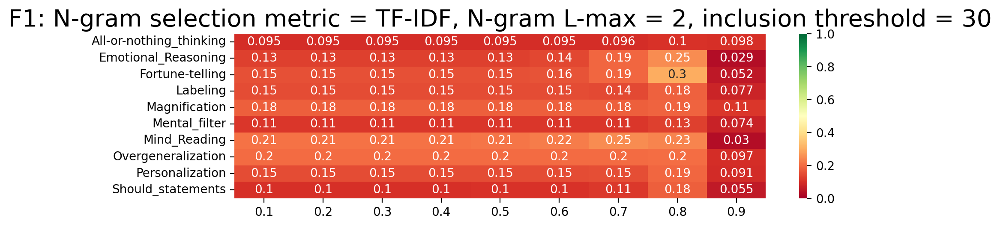

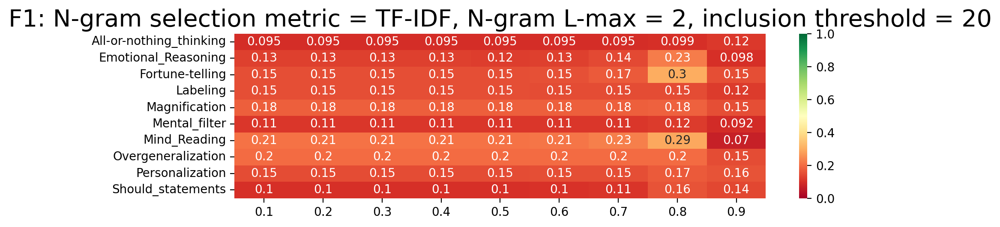

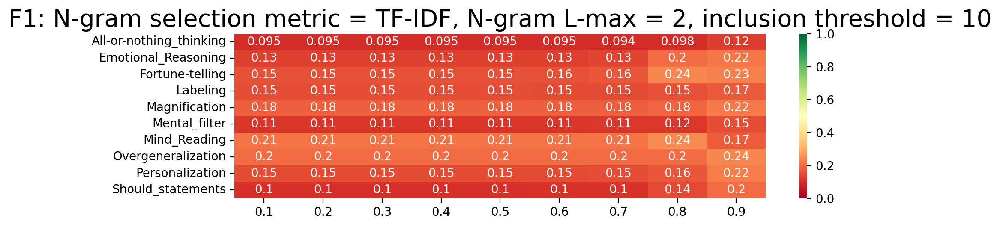

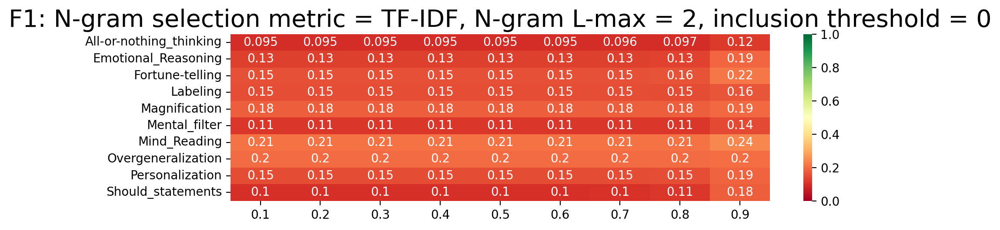

In [10]:
ngram_selection_metrics = ['TF-IDF','F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','CFR','FCR','MR','NLMI']
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
ngram_max_values = [1, 2, 3, 4]
ngram_inclusion_thresholds = [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]

# 1) N-gram selection metric - threshold

for i, ngram_selection_metric in enumerate(ngram_selection_metrics):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'third_split', 'plot_results')

    average_f1s = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    f1s_matrix = [average_f1s[metric] for metric in all_metrics]

    sorted_metrics = sorted(all_metrics)
    order = [all_metrics.index(m) for m in sorted_metrics]

    sorted_matrix = [f1s_matrix[i] for i in order]

    matrix_plot(sorted_metrics, thresholds, sorted_matrix, 1.0, 
                title = f'F1: N-gram selection metric = {ngram_selection_metric}, N-gram L-max = 2, inclusion threshold = 80%', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)



# 2) ngram_max - threshold
for i, ngram_max in enumerate(ngram_max_values):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'third_split', 'plot_results')

    average_f1s = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    f1s_matrix = [ average_f1s[metric] for metric in all_metrics ]

    sorted_metrics = sorted(all_metrics)
    order = [all_metrics.index(m) for m in sorted_metrics]

    sorted_matrix = [f1s_matrix[i] for i in order]

    matrix_plot(sorted_metrics, thresholds, sorted_matrix, 1.0, 
                title = f'F1: N-gram selection metric = TF-IDF, N-gram L-max = {ngram_max}, inclusion threshold = 80%', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)
    


# 3) ngram_inclusion_threshold - threshold
for i, ngram_inclusion_threshold in enumerate(ngram_inclusion_thresholds):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'third_split', 'plot_results')

    average_f1s = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    f1s_matrix = [ average_f1s[metric] for metric in all_metrics ]

    sorted_metrics = sorted(all_metrics)
    order = [all_metrics.index(m) for m in sorted_metrics]

    sorted_matrix = [f1s_matrix[i] for i in order]

    matrix_plot(sorted_metrics, thresholds, sorted_matrix, 1.0, 
                title = f'F1: N-gram selection metric = TF-IDF, N-gram L-max = 2, inclusion threshold = {ngram_inclusion_threshold}', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)

### Average F1 scores

In [11]:
def matrix_plot_average(row_labels, col_labels, matrix, absmax, title=None, subtitle=None, vmin=None, vmax=None, dpi=None, titlefontsize=None, subtitlefontsize=None, width=20):
    plt.rcParams["figure.figsize"] = (width, len(row_labels) / 4)
    if dpi is not None:
        plt.rcParams["figure.dpi"] = dpi

    fig, ax = plt.subplots()

    p = sns.heatmap(matrix, ax=ax, xticklabels=col_labels, yticklabels=row_labels, 
                    vmin=-absmax if vmin is None else vmin, 
                    vmax=absmax if vmax is None else vmax, 
                    cmap='RdYlGn', annot=True)
    
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

    if title is not None:
        if titlefontsize is None:
            titlefontsize = 32 if len(title) < 50 else round(32 * 50 / len(title))
        ax.set_title(title, fontsize=titlefontsize, pad=20)

    if subtitle is not None:
        if subtitlefontsize is None:
            subtitlefontsize = round(titlefontsize * 0.7)
        ax.text(0.5, 1.01, subtitle, fontsize=subtitlefontsize, ha='center', va='bottom', transform=ax.transAxes)

    plt.show()

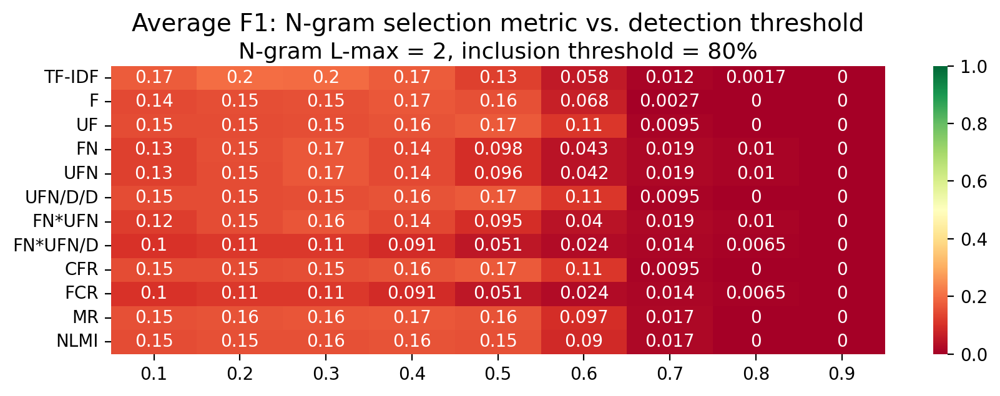

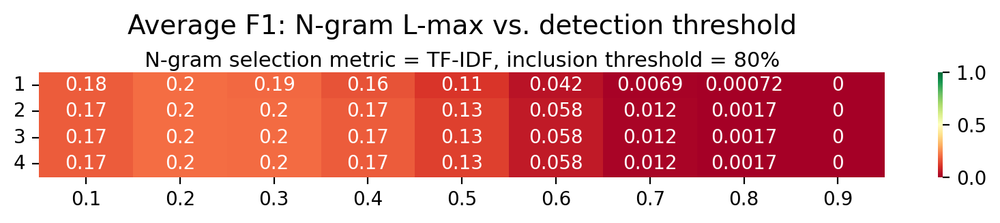

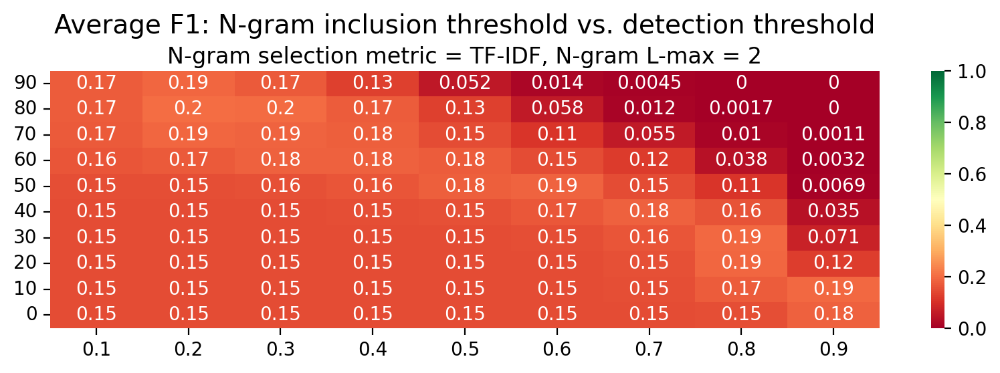

In [13]:
ngram_selection_metrics = ['TF-IDF','F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','CFR','FCR','MR','NLMI']
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
ngram_max_values = [1, 2, 3, 4]
ngram_inclusion_thresholds = [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]

# 1) N-gram selection metric - threshold
f1_matrix = []
for i, ngram_selection_metric in enumerate(ngram_selection_metrics):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset(ngram_selection_metric, 2, 80, train_df, test_df, 'third_split', 'plot_results')

    average_f1s_per_splits = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    average_f1s_per_distortions = []
    for j in range(len(thresholds)):
        vals = [average_f1s_per_splits[distortion][j] for distortion in all_metrics]
        mean_over = sum(vals) / len(vals)
        average_f1s_per_distortions.append(mean_over)

    f1_matrix.append(average_f1s_per_distortions)

matrix_plot_average(
    ngram_selection_metrics, thresholds, f1_matrix, absmax=1.0,
    title="Average F1: N-gram selection metric vs. detection threshold",
    subtitle=f"N-gram L-max = 2, inclusion threshold = 80%",
    vmin=0.0, vmax=1.0, titlefontsize=14, subtitlefontsize=13,
    dpi=200, width=10
)


# 2) ngram_max - threshold
f1_matrix = []
for i, ngram_max in enumerate(ngram_max_values):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset('TF-IDF', ngram_max, 80, train_df, test_df, 'third_split', 'plot_results')

    average_f1s_per_splits = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    average_f1s_per_distortions = []
    for j in range(len(thresholds)):
        vals = [average_f1s_per_splits[distortion][j] for distortion in all_metrics]
        mean_over = sum(vals) / len(vals)
        average_f1s_per_distortions.append(mean_over)

    f1_matrix.append(average_f1s_per_distortions)

matrix_plot_average(
    ngram_max_values, thresholds, f1_matrix, 1.0,
    title="Average F1: N-gram L-max vs. detection threshold",
    subtitle="N-gram selection metric = TF-IDF, inclusion threshold = 80%",
    vmin=0.0, vmax=1.0, titlefontsize=14, subtitlefontsize=11,
    dpi=200, width=10
)


# 3) ngram_inclusion_threshold - threshold
f1_matrix = []
for i, ngram_inclusion_threshold in enumerate(ngram_inclusion_thresholds):

    for k, (train_df, test_df) in enumerate(splits, start=1):
        if k == 1:
            first_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'first_split', 'plot_results')
        elif k == 2:
            second_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'second_split', 'plot_results')
        elif k == 3:
            third_split_f1s = analyse_dataset('TF-IDF', 2, ngram_inclusion_threshold, train_df, test_df, 'third_split', 'plot_results')

    average_f1s_per_splits = {
        metric: [
            (v1 + v2 + v3) / 3
            for v1, v2, v3 in zip(first_split_f1s[metric],
                                second_split_f1s[metric],
                                third_split_f1s[metric])
        ]
        for metric in all_metrics
    }

    average_f1s_per_distortions = []
    for j in range(len(thresholds)):
        vals = [average_f1s_per_splits[distortion][j] for distortion in all_metrics]
        mean_over = sum(vals) / len(vals)
        average_f1s_per_distortions.append(mean_over)

    f1_matrix.append(average_f1s_per_distortions)

matrix_plot_average(
    ngram_inclusion_thresholds, thresholds, f1_matrix, 1.0,
    title="Average F1: N-gram inclusion threshold vs. detection threshold",
    subtitle="N-gram selection metric = TF-IDF, N-gram L-max = 2",
    vmin=0.0, vmax=1.0, titlefontsize=14, subtitlefontsize=12,
    dpi=200, width=10
)

## Baseline models

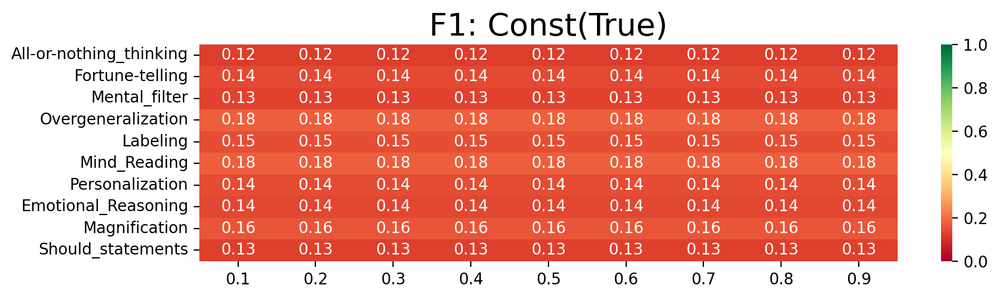

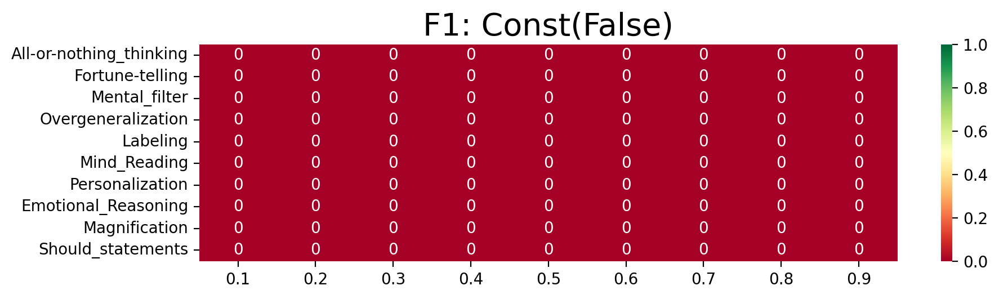

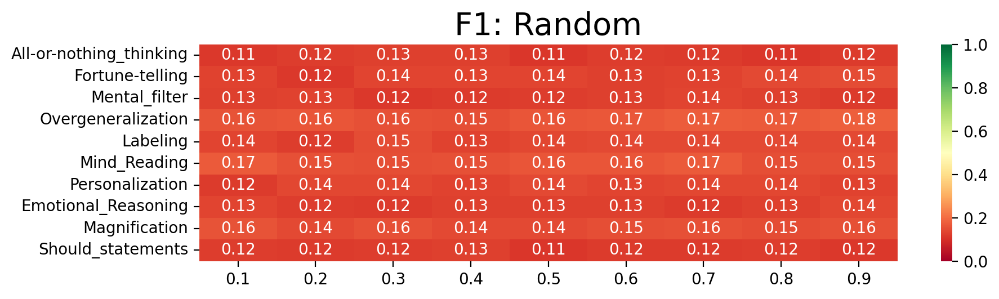

In [ ]:
evaluators = {
    'Const(True)': our_evaluator_true,
    'Const(False)': our_evaluator_false,
    'Random': our_evaluator_random,
}

for model in ['Const(True)','Const(False)','Random']:
    pres = [[] for i in range(len(all_metrics))]
    recs = [[] for i in range(len(all_metrics))]
    f1s = [[] for i in range(len(all_metrics))]
    accs = [[] for i in range(len(all_metrics))]
    evaluator = evaluators[model]
    for t in thresholds:
        pre, rec, f1, acc = evaluate_tm_df(df,None,evaluator,t)
        mi = 0
        for metric in all_metrics:
            pres[mi].append(pre[metric])
            recs[mi].append(rec[metric])
            f1s[mi].append(f1[metric])
            accs[mi].append(acc[metric])
            mi += 1

    matrix_plot(all_metrics, thresholds, f1s, 1.0, title = f'F1: {model}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)

## ROC-AUC score

In [14]:
from sklearn.metrics import roc_auc_score

def compute_auc_for_metric(df, tm, metric_name):
    y_true = []
    y_score = []
    for _, row in df.iterrows():
        text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]

        prim = row.iloc[2].replace(' ','_')
        sec  = row.iloc[3].replace(' ','_') if pd.notna(row.iloc[3]) else None
        true = int(metric_name in {prim, sec})
        y_true.append(true)

        scores = tm.get_sentiment_words(text)
        y_score.append(scores.get(metric_name, 0.0))

    if len(set(y_true)) < 2:
        return float('nan')
    return roc_auc_score(y_true, y_score)


def evaluate_roc_auc(df_test, tm):
    aucs = {}
    for m in all_metrics:
        aucs[m] = compute_auc_for_metric(df_test, tm, m)
    macro = sum(v for v in aucs.values() if not pd.isna(v)) / len([v for v in aucs.values() if not pd.isna(v)])
    return aucs, macro


def analyse_dataset_roc_auc(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, df_train, df_test, name_split_folder, print_or_plot):
    
    if name_split_folder == 'first_split' and print_or_plot == 'print_results':
        print('\nN-gram selection metric:', ngram_selection_metric)
        print('N-gram max length:', ngram_max)
        print('N-gram inclusion threshold:', ngram_inclusion_threshold)

    if ngram_selection_metric == 'TF-IDF':
        model_ngram = count_ngrams_plus_tf_idf(df_train,ngram_max,binary=False,clean_punct=True)
    
    elif ngram_selection_metric in ['F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','FN*UFN*UF/D/D','CFR','FCR','MR','NLMI']:
        distortions, frequency, all_n_grams, frequency_self_normalized, unique_frequency, uniq_all_n_grams, n_gram_distortions, \
        norm_uniq_n_gram_dicts, n_gram_distortions_counts, norm, unique_frequency_self_normalized, norm_norm_uniq, norm_norm_uniq_norm, \
        norm_norm_uniq_norm_norm, fcr, cfr, mr, nl_mi, N = count_ngrams_plus(df_train,ngram_max,binary=False)
        
        selection_metrics = {
            'F':frequency,
            'UF':unique_frequency,
            'FN':frequency_self_normalized,
            'UFN':unique_frequency_self_normalized,
            'UFN/D/D':norm_uniq_n_gram_dicts,
            'FN*UFN':norm_norm_uniq,
            'FN*UFN/D':norm_norm_uniq_norm,
            'CFR':cfr,
            'FCR':fcr,
            'MR':mr,
            'NLMI':nl_mi}
        
        model_ngram = selection_metrics[ngram_selection_metric]

    # Filter out values below the threshold
    filtered_model_ngram = ngrams_inclusion(model_ngram, ngram_inclusion_threshold)

    # Create .txt files for each distortion
    distortions_labels = create_model_files(filtered_model_ngram, name_split_folder)
    tm = TextMetrics(language_metrics(distortions_labels, name_split_folder), encoding = "utf-8", debug=False)

    if print_or_plot == 'print_results':
        if name_split_folder == 'first_split':
            print('\tFIRST COMBINATION')
        elif name_split_folder == 'second_split':
            print('\n\tSECOND COMBINATION')
        elif name_split_folder == 'third_split':
            print('\n\tTHIRD COMBINATION')

    aucs_dict, auc_macro = evaluate_roc_auc(df_test, tm)

    if print_or_plot == 'print_results':
        print(f"\nROC-AUC per metric:")
        for m, v in aucs_dict.items():
            print(f"\t{m}: {v:.3f}")
        print(f"Macro-AUC: {auc_macro:.3f}\n")

    return aucs_dict

In [15]:
def grid_search_roc_auc(df):
    part1 = df[df.index % 3 == 1]
    part2 = df[df.index % 3 == 2]
    part3 = df[df.index % 3 == 0]

    splits = [
        (pd.concat([part1, part2]), part3),  # (1 + 2) -> train, (3) -> test
        (pd.concat([part1, part3]), part2),  # (1 + 3) -> train, (2) -> test
        (pd.concat([part2, part3]), part1)   # (2 + 3) -> train, (1) -> test
    ]

    for ngram_selection_metric in ['TF-IDF','F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','CFR','FCR','MR','NLMI']:
        for ngram_max in range (1, 5):
            for ngram_inclusion_threshold in [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]:
                for i, (train_df, test_df) in enumerate(splits, start=1):
                    if i == 1:
                        first_split_roc_auc = analyse_dataset_roc_auc(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'first_split', 'print_results')
                    elif i == 2:
                        second_split_roc_auc = analyse_dataset_roc_auc(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'second_split', 'print_results')
                    elif i == 3:
                        third_split_roc_auc = analyse_dataset_roc_auc(ngram_selection_metric, ngram_max, ngram_inclusion_threshold, train_df, test_df, 'third_split', 'print_results')

In [16]:
grid_search_roc_auc(df)


N-gram selection metric: TF-IDF
N-gram max length: 1
N-gram inclusion threshold: 90
	FIRST COMBINATION

ROC-AUC per metric:
	All-or-nothing_thinking: 0.487
	Fortune-telling: 0.643
	Mental_filter: 0.540
	Overgeneralization: 0.551
	Labeling: 0.525
	Mind_Reading: 0.529
	Personalization: 0.567
	Emotional_Reasoning: 0.683
	Magnification: 0.549
	Should_statements: 0.535
Macro-AUC: 0.561


	SECOND COMBINATION

ROC-AUC per metric:
	All-or-nothing_thinking: 0.529
	Fortune-telling: 0.648
	Mental_filter: 0.551
	Overgeneralization: 0.515
	Labeling: 0.600
	Mind_Reading: 0.548
	Personalization: 0.563
	Emotional_Reasoning: 0.624
	Magnification: 0.497
	Should_statements: 0.631
Macro-AUC: 0.571


	THIRD COMBINATION

ROC-AUC per metric:
	All-or-nothing_thinking: 0.478
	Fortune-telling: 0.610
	Mental_filter: 0.547
	Overgeneralization: 0.447
	Labeling: 0.484
	Mind_Reading: 0.517
	Personalization: 0.605
	Emotional_Reasoning: 0.630
	Magnification: 0.491
	Should_statements: 0.728
Macro-AUC: 0.554


N-gram s

In [17]:
# Best model
part1 = df[df.index % 3 == 1]
part2 = df[df.index % 3 == 2]
part3 = df[df.index % 3 == 0]

splits = [
    (pd.concat([part1, part2]), part3),  # (1 + 2) -> train, (3) -> test
    (pd.concat([part1, part3]), part2),  # (1 + 3) -> train, (2) -> test
    (pd.concat([part2, part3]), part1)   # (2 + 3) -> train, (1) -> test
]

for i, (train_df, test_df) in enumerate(splits, start=1):
    if i == 1:
        first_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'first_split', 'print_results')
    elif i == 2:
        second_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'second_split', 'print_results')
    elif i == 3:
        third_split_f1s = analyse_dataset('TF-IDF', 2, 80, train_df, test_df, 'third_split', 'print_results')


N-gram selection metric: TF-IDF
N-gram max length: 2
N-gram inclusion threshold: 80
	FIRST COMBINATION
		Threshold: 0.1 (distortion, F1 score):
				All-or-nothing_thinking	0.10340775558166862
				Fortune-telling	0.3597122302158273
				Mental_filter	0.08235294117647059
				Overgeneralization	0.17422434367541767
				Labeling	0.12605042016806722
				Mind_Reading	0.25233644859813087
				Personalization	0.18295218295218296
				Emotional_Reasoning	0.20786516853932585
				Magnification	0.15272727272727274
				Should_statements	0.13414634146341464
		Threshold: 0.2 (distortion, F1 score):
				All-or-nothing_thinking	0.10352941176470588
				Fortune-telling	0.4070796460176991
				Mental_filter	0.087248322147651
				Overgeneralization	0.17560975609756097
				Labeling	0.14942528735632182
				Mind_Reading	0.29084380610412924
				Personalization	0.22841225626740946
				Emotional_Reasoning	0.2569444444444444
				Magnification	0.15480649188514356
				Should_statements	0.19730941704035873
		Threshold: 